# 3x Leveraged ETF Rebalancing Strategy

Based on Dr. Lewis A. Glenn's paper "Long-Term Investing in Triple Leveraged ETFs" (SSRN 3722318) and the [SetupAlpha Medium article](https://medium.com/@setupalpha.capital/3x-leveraged-etf-strategy-2-600-return-with-38-drawdown-trading-strategy-rules-f4dad806bc25).

## Strategy Rules:
1. **Universe**: TQQQ (3x Nasdaq-100), TMF (3x 20-Year Treasury)
2. **Allocation**: 50% TQQQ, 50% TMF
3. **Rebalancing**: Every 2 months — rebalance back to 50/50 split
4. **Per-Asset Trend Filter (SMA-200 on underlying)**:
   - Each leg independently monitored via its underlying index (QQQ for TQQQ, TLT for TMF)
   - **Exit**: when underlying drops below its 200-day SMA → park that leg in IEF
   - **Re-enter**: only when underlying crosses 5% above SMA (hysteresis prevents whipsaw)
   - Legs switch independently — one can be in IEF while the other holds
5. **Slippage**: 0.25% per trade

## Article Targets:
| Metric | Target |
|--------|--------|
| CAGR | 23.8% |
| Max DD | -38.7% |
| Sharpe | 0.95 |
| Final | $2.7M (from $100K) |

## Key Insight:
The negative correlation between tech equities and long-duration bonds creates a natural hedge that offsets beta slippage from daily leverage resets. The per-asset trend filter avoids prolonged drawdowns (e.g., 2022 tech bear market) by parking each leg in IEF when its underlying trend breaks down.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from pathlib import Path
from datetime import datetime, timedelta
import sys, warnings
warnings.filterwarnings('ignore')

import subprocess as _sp
PROJECT_ROOT = Path(_sp.check_output(
    "git rev-parse --show-toplevel", shell=True, text=True, cwd="."
).strip())

sys.path.insert(0, str(PROJECT_ROOT / 'signum'))
from signum import Chart, Dashboard

pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.2f}'.format)

## Load & Prepare Data

In [5]:
import yfinance as yf

df = pd.read_parquet(PROJECT_ROOT / 'equities' / 'triple_leveraged_etfs.parquet')
prices = df.pivot(index='date', columns='ticker', values='close').sort_index()
prices = prices[['TQQQ', 'TMF', 'IEF']].dropna()
returns = prices.pct_change().dropna()

print(f"Leveraged ETFs: {prices.index[0].date()} → {prices.index[-1].date()} ({len(prices)} days)")

# Download underlying QQQ & TLT for SMA trend filter signals
start = prices.index.min() - pd.Timedelta(days=400)  # warmup for 200-day SMA
end = prices.index.max()
qqq = yf.download('QQQ', start=start, end=end, progress=False)['Close'].squeeze()
tlt = yf.download('TLT', start=start, end=end, progress=False)['Close'].squeeze()
qqq = qqq.reindex(prices.index, method='ffill')
tlt = tlt.reindex(prices.index, method='ffill')
print(f"QQQ: {len(qqq)} rows  |  TLT: {len(tlt)} rows")

Leveraged ETFs: 2010-02-11 → 2026-03-03 (4038 days)
QQQ: 4038 rows  |  TLT: 4038 rows


In [6]:
def calculate_metrics(portfolio_values: pd.Series, risk_free_rate: float = 0.02) -> dict:
    """Calculate key performance metrics for a portfolio equity curve."""
    daily_returns = portfolio_values.pct_change().dropna()
    years = (portfolio_values.index[-1] - portfolio_values.index[0]).days / 365.25
    total_return = portfolio_values.iloc[-1] / portfolio_values.iloc[0] - 1
    cagr = (1 + total_return) ** (1/years) - 1
    volatility = daily_returns.std() * np.sqrt(252)
    sharpe = (cagr - risk_free_rate) / volatility if volatility > 0 else 0
    downside_std = daily_returns[daily_returns < 0].std() * np.sqrt(252)
    sortino = (cagr - risk_free_rate) / downside_std if downside_std > 0 else 0
    drawdown = (portfolio_values - portfolio_values.cummax()) / portfolio_values.cummax()
    max_drawdown = drawdown.min()
    mar_ratio = abs(cagr / max_drawdown) if max_drawdown != 0 else float('inf')
    return {
        'Years': years, 'Total Return': total_return * 100, 'CAGR': cagr * 100,
        'Volatility': volatility * 100, 'Sharpe Ratio': sharpe, 'Sortino Ratio': sortino,
        'Max Drawdown': max_drawdown * 100, 'MAR Ratio': mar_ratio,
    }

---
## Part 1: Manual Strategy Implementation
50/50 TQQQ/TMF with bimonthly rebalancing and per-asset SMA-200 trend filter on underlying (QQQ/TLT).

In [7]:
# Strategy Parameters
REBALANCE_MONTHS = 2
TARGET_WEIGHT_TQQQ = 0.50
TARGET_WEIGHT_TMF = 0.50
INITIAL_CAPITAL = 100_000
SLIPPAGE_PCT = 0.0025
SMA_PERIOD = 200
EXIT_BUFFER = 0.00    # exit when underlying < SMA (at SMA line)
ENTER_BUFFER = 0.05   # re-enter only when underlying > SMA * 1.05

# ---- Build per-asset trend filter signals ----
qqq_sma = qqq.rolling(SMA_PERIOD).mean()
tlt_sma = tlt.rolling(SMA_PERIOD).mean()

tqqq_hold_list, tmf_hold_list = [], []
tq_state, tm_state = True, True

for dt in prices.index:
    q, t = qqq.get(dt, np.nan), tlt.get(dt, np.nan)
    qs, ts = qqq_sma.get(dt, np.nan), tlt_sma.get(dt, np.nan)
    if pd.isna(qs) or pd.isna(q):
        tqqq_hold_list.append(True); tmf_hold_list.append(True); continue
    # QQQ → TQQQ signal
    if tq_state and q < qs * (1 + EXIT_BUFFER):
        tq_state = False
    elif not tq_state and q > qs * (1 + ENTER_BUFFER):
        tq_state = True
    # TLT → TMF signal
    if tm_state and t < ts * (1 + EXIT_BUFFER):
        tm_state = False
    elif not tm_state and t > ts * (1 + ENTER_BUFFER):
        tm_state = True
    tqqq_hold_list.append(tq_state); tmf_hold_list.append(tm_state)

tqqq_signal = pd.Series(tqqq_hold_list, index=prices.index, name='tqqq_hold')
tmf_signal  = pd.Series(tmf_hold_list,  index=prices.index, name='tmf_hold')

print(f"TQQQ in IEF: {(~tqqq_signal).sum()} days ({(~tqqq_signal).mean()*100:.1f}%)")
print(f"TMF  in IEF: {(~tmf_signal).sum()} days ({(~tmf_signal).mean()*100:.1f}%)")

# ---- Run strategy with per-asset trend filter ----
def run_strategy(prices, tqqq_signal, tmf_signal):
    """Per-asset trend filter with bimonthly rebalancing.
    Each leg independently holds its leveraged ETF or parks in IEF.
    """
    dates = prices.index
    half = INITIAL_CAPITAL / 2
    tq_sh = tq_ief = tm_sh = tm_ief = 0.0
    tq_in = tm_in = False

    month_ends = dates.to_series().groupby(dates.to_period('M')).last()
    rebal_dates_set = set(month_ends.iloc[::REBALANCE_MONTHS].values)
    last_rebal = None
    initialized = False
    records = []

    for i, dt in enumerate(dates):
        tp = prices.loc[dt, 'TQQQ']
        mp = prices.loc[dt, 'TMF']
        ip = prices.loc[dt, 'IEF']

        if pd.isna(tqqq_signal.get(dt)) or pd.isna(tmf_signal.get(dt)):
            records.append({'date': dt, 'portfolio_value': INITIAL_CAPITAL,
                'weight_tqqq': 0.5, 'weight_tmf': 0.5,
                'in_cash': False, 'tqqq_in_ief': False, 'tmf_in_ief': False,
                'shares_tqqq': 0, 'shares_tmf': 0})
            continue

        if not initialized:
            if tqqq_signal.loc[dt]:
                tq_sh = half / tp; tq_in = True
            else:
                tq_ief = half / ip; tq_in = False
            if tmf_signal.loc[dt]:
                tm_sh = half / mp; tm_in = True
            else:
                tm_ief = half / ip; tm_in = False
            last_rebal = dt.to_period('M')
            initialized = True
            tq_v = tq_sh * tp + tq_ief * ip
            tm_v = tm_sh * mp + tm_ief * ip
            pv = tq_v + tm_v
            records.append({'date': dt, 'portfolio_value': pv,
                'weight_tqqq': tq_v / pv, 'weight_tmf': tm_v / pv,
                'in_cash': (not tq_in and not tm_in),
                'tqqq_in_ief': not tq_in, 'tmf_in_ief': not tm_in,
                'shares_tqqq': tq_sh, 'shares_tmf': tm_sh})
            continue

        tq_v = tq_sh * tp + tq_ief * ip
        tm_v = tm_sh * mp + tm_ief * ip

        is_rebal = (dt in rebal_dates_set and last_rebal is not None
                    and dt.to_period('M') != last_rebal)

        # Per-asset trend switches (daily)
        if tq_in and not tqqq_signal.loc[dt]:
            tq_v *= (1 - SLIPPAGE_PCT); tq_sh = 0; tq_ief = tq_v / ip; tq_in = False
        elif not tq_in and tqqq_signal.loc[dt]:
            tq_v *= (1 - SLIPPAGE_PCT); tq_ief = 0; tq_sh = tq_v / tp; tq_in = True
        if tm_in and not tmf_signal.loc[dt]:
            tm_v *= (1 - SLIPPAGE_PCT); tm_sh = 0; tm_ief = tm_v / ip; tm_in = False
        elif not tm_in and tmf_signal.loc[dt]:
            tm_v *= (1 - SLIPPAGE_PCT); tm_ief = 0; tm_sh = tm_v / mp; tm_in = True

        # Bimonthly rebalance (equalize legs)
        if is_rebal:
            total = tq_v + tm_v
            cost = abs(tq_v - total / 2) * SLIPPAGE_PCT
            total -= cost; target = total / 2
            if tq_in:
                tq_sh = target / tp; tq_ief = 0
            else:
                tq_ief = target / ip; tq_sh = 0
            if tm_in:
                tm_sh = target / mp; tm_ief = 0
            else:
                tm_ief = target / ip; tm_sh = 0
            tq_v = tm_v = target
            last_rebal = dt.to_period('M')

        pv = tq_v + tm_v
        records.append({'date': dt, 'portfolio_value': pv,
            'weight_tqqq': tq_v / pv if pv > 0 else 0,
            'weight_tmf': tm_v / pv if pv > 0 else 0,
            'in_cash': (not tq_in and not tm_in),
            'tqqq_in_ief': not tq_in, 'tmf_in_ief': not tm_in,
            'shares_tqqq': tq_sh, 'shares_tmf': tm_sh})

    return pd.DataFrame(records).set_index('date')

strategy_results = run_strategy(prices, tqqq_signal, tmf_signal)
print(f"${INITIAL_CAPITAL:,} → ${strategy_results['portfolio_value'].iloc[-1]:,.0f}  |  "
      f"{strategy_results.index.min()} → {strategy_results.index.max()}")

TQQQ in IEF: 838 days (20.8%)
TMF  in IEF: 2389 days (59.2%)
$100,000 → $2,998,202  |  2010-02-11 00:00:00 → 2026-03-03 00:00:00


### Underlying SMA Signals & Individual Assets
QQQ/TLT SMA-200 trend signals, and each asset's standalone performance.

In [8]:
# QQQ/TLT SMA-200 signals with trend filter shading
tqqq_cash_pos = pd.DataFrame({'position': (~tqqq_signal).astype(int)}, index=prices.index)
tmf_cash_pos  = pd.DataFrame({'position': (~tmf_signal).astype(int)}, index=prices.index)

Dashboard(
    panes=[
        (Chart(theme='midnight', height=250)
         .line(qqq, name='QQQ', color='#2196F3', width=2)
         .line(qqq_sma, name=f'SMA-{SMA_PERIOD}', color='#FF9800', width=1)
         .line(qqq_sma * (1 + ENTER_BUFFER), name=f'+{ENTER_BUFFER:.0%} re-enter', color='#4CAF50', width=1)
         .shade(tqqq_cash_pos, position_col='position', color='#F44336', opacity=0.12)),
        (Chart(theme='midnight', height=250)
         .line(tlt, name='TLT', color='#9C27B0', width=2)
         .line(tlt_sma, name=f'SMA-{SMA_PERIOD}', color='#FF9800', width=1)
         .line(tlt_sma * (1 + ENTER_BUFFER), name=f'+{ENTER_BUFFER:.0%} re-enter', color='#4CAF50', width=1)
         .shade(tmf_cash_pos, position_col='position', color='#F44336', opacity=0.12)),
    ],
    titles=['QQQ vs SMA-200 (→ TQQQ signal) — red = parked in IEF',
            'TLT vs SMA-200 (→ TMF signal) — red = parked in IEF'],
    theme='midnight',
).show()

# Individual asset B&H performance
tqqq_equity = (prices['TQQQ'] / prices['TQQQ'].iloc[0]) * INITIAL_CAPITAL
tmf_equity  = (prices['TMF'] / prices['TMF'].iloc[0]) * INITIAL_CAPITAL
tqqq_rets = prices['TQQQ'].pct_change().dropna()
tmf_rets  = prices['TMF'].pct_change().dropna()

tqqq_m = calculate_metrics(tqqq_equity)
tmf_m = calculate_metrics(tmf_equity)
pd.DataFrame({'TQQQ (3x Nasdaq)': tqqq_m, 'TMF (3x 20Y Treasury)': tmf_m}).round(2)

,TQQQ (3x Nasdaq),TMF (3x 20Y Treasury)
Years,16.05,16.05
Total Return,22137.63,-47.88
CAGR,40.02,-3.98
Volatility,60.99,44.59
Sharpe Ratio,0.62,-0.13
Sortino Ratio,0.80,-0.20
Max Drawdown,-81.75,-93.33
MAR Ratio,0.49,0.04


### Combined Strategy: 50/50 Rebalanced + Crash Filter
Combining negatively correlated TQQQ and TMF reduces portfolio volatility and improves risk-adjusted returns.

In [9]:
# Combined Strategy vs Individual Assets
bh5050_equity = 0.5 * tqqq_equity + 0.5 * tmf_equity
strat_equity = strategy_results['portfolio_value']

bh5050_rets = bh5050_equity.pct_change().dropna()
strat_rets  = strat_equity.pct_change().dropna()

common_idx = tqqq_rets.index.intersection(tmf_rets.index).intersection(strat_rets.index)
tqqq_rets = tqqq_rets.loc[common_idx]
tmf_rets  = tmf_rets.loc[common_idx]
bh5050_rets = bh5050_rets.loc[common_idx]
strat_rets  = strat_rets.loc[common_idx]

def asset_metrics(rets, rf=0.02):
    ann_ret = (1 + rets.mean()) ** 252 - 1
    ann_vol = rets.std() * np.sqrt(252)
    sharpe  = (ann_ret - rf) / ann_vol if ann_vol > 0 else 0
    sortino_denom = rets[rets < 0].std() * np.sqrt(252)
    sortino = (ann_ret - rf) / sortino_denom if sortino_denom > 0 else 0
    cum = (1 + rets).cumprod()
    dd  = (cum / cum.cummax() - 1).min()
    return {
        'Ann. Return (%)': ann_ret * 100, 'Ann. Vol (%)': ann_vol * 100,
        'Sharpe': sharpe, 'Sortino': sortino, 'Max DD (%)': dd * 100,
        'Hit Rate (%)': (rets > 0).mean() * 100,
        'Total Return (%)': ((1 + rets).prod() - 1) * 100,
    }

metrics_table = pd.DataFrame({
    'TQQQ': asset_metrics(tqqq_rets),
    'TMF': asset_metrics(tmf_rets),
    '50/50 Buy-Hold': asset_metrics(bh5050_rets),
    'Strategy (Rebal+Filter)': asset_metrics(strat_rets),
})
metrics_table.round(2)

,TQQQ,TMF,50/50 Buy-Hold,Strategy (Rebal+Filter)
Ann. Return (%),69.04,6.07,53.56,27.68
Ann. Vol (%),60.99,44.59,51.71,25.28
Sharpe,1.10,0.09,1.00,1.02
Sortino,1.41,0.14,1.24,1.33
Max DD (%),-81.75,-93.33,-81.60,-38.03
Hit Rate (%),55.81,51.99,56.18,55.19
Total Return (%),22137.63,-47.88,11044.88,2898.20


In [10]:
# ====== Per-Asset Cumulative Returns & Rolling Sharpe — Signum ======

# Cumulative returns (percentage growth)
tqqq_cum = ((1 + tqqq_rets).cumprod() - 1) * 100
tmf_cum  = ((1 + tmf_rets).cumprod() - 1) * 100
bh5050_cum = ((1 + bh5050_rets).cumprod() - 1) * 100
strat_cum  = ((1 + strat_rets).cumprod() - 1) * 100

# Rolling 252-day Sharpe (annualised)
window = 252
tqqq_roll_sharpe  = (tqqq_rets.rolling(window).mean() / tqqq_rets.rolling(window).std()) * np.sqrt(252)
tmf_roll_sharpe   = (tmf_rets.rolling(window).mean() / tmf_rets.rolling(window).std()) * np.sqrt(252)
bh5050_roll_sharpe = (bh5050_rets.rolling(window).mean() / bh5050_rets.rolling(window).std()) * np.sqrt(252)
strat_roll_sharpe  = (strat_rets.rolling(window).mean() / strat_rets.rolling(window).std()) * np.sqrt(252)

# Rolling 90-day correlation (TQQQ vs TMF)
roll_corr = tqqq_rets.rolling(90).corr(tmf_rets)

Dashboard(
    panes=[
        (Chart(theme='midnight', height=280)
         .line(tqqq_cum, name='TQQQ', color='#2196F3', width=2)
         .line(tmf_cum, name='TMF', color='#4CAF50', width=2)
         .line(bh5050_cum, name='50/50 BH', color='#FF9800', width=1)
         .line(strat_cum, name='Strategy', color='#9C27B0', width=2)),
        (Chart(theme='midnight', height=180)
         .line(tqqq_roll_sharpe, name='TQQQ', color='#2196F3', width=1)
         .line(tmf_roll_sharpe, name='TMF', color='#4CAF50', width=1)
         .line(bh5050_roll_sharpe, name='50/50 BH', color='#FF9800', width=1)
         .line(strat_roll_sharpe, name='Strategy', color='#9C27B0', width=1)),
        (Chart(theme='midnight', height=120)
         .baseline(roll_corr.dropna(), base_value=0)),
    ],
    titles=['Cumulative Returns (%)', 'Rolling 1Y Sharpe', 'Rolling 90d TQQQ–TMF Correlation'],
    theme='midnight',
).show()

In [11]:
# Strategy PnL attribution per leg
w_tqqq_ts = strategy_results['weight_tqqq'].reindex(common_idx).ffill()
w_tmf_ts  = strategy_results['weight_tmf'].reindex(common_idx).ffill()
tqqq_contrib = (w_tqqq_ts.shift(1) * tqqq_rets).dropna()
tmf_contrib  = (w_tmf_ts.shift(1) * tmf_rets).dropna()
total_contrib = tqqq_contrib + tmf_contrib

tqqq_cum_pnl = tqqq_contrib.cumsum() * 100
tmf_cum_pnl  = tmf_contrib.cumsum() * 100
total_cum_pnl = total_contrib.cumsum() * 100

tqqq_dd = ((1 + tqqq_rets).cumprod() / (1 + tqqq_rets).cumprod().cummax() - 1) * 100
tmf_dd  = ((1 + tmf_rets).cumprod() / (1 + tmf_rets).cumprod().cummax() - 1) * 100
strat_dd = ((1 + strat_rets).cumprod() / (1 + strat_rets).cumprod().cummax() - 1) * 100

Dashboard(
    panes=[
        (Chart(theme='midnight', height=220)
         .line(tqqq_cum_pnl, name='TQQQ contrib', color='#2196F3', width=1)
         .line(tmf_cum_pnl, name='TMF contrib', color='#4CAF50', width=1)
         .line(total_cum_pnl, name='Total', color='#9C27B0', width=2)),
        (Chart(theme='midnight', height=180)
         .line(tqqq_dd, name='TQQQ DD', color='#2196F3', width=1)
         .line(tmf_dd, name='TMF DD', color='#4CAF50', width=1)
         .area(strat_dd, name='Strategy DD', lineColor='#9C27B0',
               color='rgba(156,39,176,0.15)')),
    ],
    titles=['Cumulative PnL Contribution (%)', 'Drawdowns: Per-Asset vs Strategy'],
    theme='midnight',
).show()

### Positions, Weights & Trend Filter Events
Share positions, portfolio weights, and markers for trend filter entry/exit events per leg.

In [12]:
# Trend filter shading — per leg
tqqq_ief_pos = strategy_results['tqqq_in_ief'].astype(int).to_frame('position')
tmf_ief_pos  = strategy_results['tmf_in_ief'].astype(int).to_frame('position')
any_ief = pd.DataFrame({
    'position': (strategy_results['tqqq_in_ief'] | strategy_results['tmf_in_ief']).astype(int)
}, index=strategy_results.index)

# Build signal markers for trend filter entry/exit
tqqq_ief = strategy_results['tqqq_in_ief']
tmf_ief  = strategy_results['tmf_in_ief']
tqqq_exit  = tqqq_ief & ~tqqq_ief.shift(1, fill_value=False)
tqqq_enter = ~tqqq_ief & tqqq_ief.shift(1, fill_value=False)
tmf_exit   = tmf_ief & ~tmf_ief.shift(1, fill_value=False)
tmf_enter  = ~tmf_ief & tmf_ief.shift(1, fill_value=False)

# Composite signal markers
_filter_sig = pd.DataFrame({'signal': 0}, index=strategy_results.index)
_filter_sig.loc[tqqq_exit | tmf_exit, 'signal'] = -1   # exit = sell
_filter_sig.loc[tqqq_enter | tmf_enter, 'signal'] = 1  # re-enter = buy

w_cash = 1 - strategy_results['weight_tqqq'] - strategy_results['weight_tmf']

Dashboard(
    panes=[
        (Chart(theme='midnight', height=280)
         .line(strategy_results['portfolio_value'], name='Portfolio', color='#9C27B0', width=2)
         .shade(any_ief, position_col='position', color='#FF5722', opacity=0.15)
         .signals(_filter_sig, signal_col='signal',
                  buy_color='#4CAF50', sell_color='#F44336',
                  buy_text='RE-ENTER', sell_text='EXIT')),
        (Chart(theme='midnight', height=140)
         .line(strategy_results['shares_tqqq'], name='TQQQ shares', color='#2196F3', width=1)
         .line(strategy_results['shares_tmf'], name='TMF shares', color='#4CAF50', width=1)),
        (Chart(theme='midnight', height=120)
         .line(strategy_results['weight_tqqq'] * 100, name='TQQQ wt%', color='#2196F3', width=1)
         .line(strategy_results['weight_tmf'] * 100, name='TMF wt%', color='#4CAF50', width=1)
         .line(w_cash * 100, name='IEF wt%', color='#FFC107', width=1)),
    ],
    titles=['Portfolio Equity & Trend Filter Events (orange = filter active)', 'Share Counts', 'Weights (%)'],
    theme='midnight',
).show()

n_tqqq_switches = (tqqq_exit.sum() + tqqq_enter.sum())
n_tmf_switches = (tmf_exit.sum() + tmf_enter.sum())
print(f"TQQQ filter switches: {n_tqqq_switches}  |  TMF filter switches: {n_tmf_switches}")

TQQQ filter switches: 22  |  TMF filter switches: 20


### Daily Order Book
A complete daily ledger of positions, weights, and order deltas — every row is a trading day.
- **shares_tqqq / shares_tmf**: end-of-day position
- **order_tqqq / order_tmf**: change in shares vs prior day (the "order")
- **event**: hold · rebalance · tqqq_exit · tqqq_enter · tmf_exit · tmf_enter · initial_alloc

In [13]:
import datetime

# Build daily order book from strategy_results
daily_book = strategy_results[['portfolio_value', 'weight_tqqq', 'weight_tmf',
                                'in_cash', 'tqqq_in_ief', 'tmf_in_ief',
                                'shares_tqqq', 'shares_tmf']].copy()

# Add prices
daily_book['tqqq_price'] = prices['TQQQ']
daily_book['tmf_price'] = prices['TMF']

# IEF weight
daily_book['weight_ief'] = 1.0 - daily_book['weight_tqqq'] - daily_book['weight_tmf']

# Daily order = change in shares from previous day
daily_book['order_tqqq'] = daily_book['shares_tqqq'].diff()
daily_book['order_tmf'] = daily_book['shares_tmf'].diff()

# Notional value of each order
daily_book['order_notional_tqqq'] = daily_book['order_tqqq'] * daily_book['tqqq_price']
daily_book['order_notional_tmf'] = daily_book['order_tmf'] * daily_book['tmf_price']

# --- Event labels ---
tqqq_ief = daily_book['tqqq_in_ief']
tmf_ief  = daily_book['tmf_in_ief']
tqqq_exit_ev  = tqqq_ief & ~tqqq_ief.shift(1, fill_value=False)
tqqq_enter_ev = ~tqqq_ief & tqqq_ief.shift(1, fill_value=False)
tmf_exit_ev   = tmf_ief & ~tmf_ief.shift(1, fill_value=False)
tmf_enter_ev  = ~tmf_ief & tmf_ief.shift(1, fill_value=False)
has_order = (daily_book['order_tqqq'].abs() > 0.01) | (daily_book['order_tmf'].abs() > 0.01)

events = pd.Series('hold', index=daily_book.index)
events.iloc[0] = 'initial_alloc'
events[tqqq_exit_ev] = 'tqqq_exit'
events[tqqq_enter_ev] = 'tqqq_enter'
events[tmf_exit_ev] = 'tmf_exit'
events[tmf_enter_ev] = 'tmf_enter'
rebal_mask = has_order & ~tqqq_exit_ev & ~tqqq_enter_ev & ~tmf_exit_ev & ~tmf_enter_ev & (events == 'hold')
events[rebal_mask] = 'rebalance'
daily_book['event'] = events

# --- Extend to current date ---
today = pd.Timestamp(datetime.date.today())
last_data_date = daily_book.index.max()

if today > last_data_date:
    extension_dates = pd.bdate_range(last_data_date + pd.Timedelta(days=1), today)
    if len(extension_dates) > 0:
        last_row = daily_book.iloc[-1]
        ext_df = pd.DataFrame(index=extension_dates)
        ext_df.index.name = 'date'
        for col in ['portfolio_value', 'tqqq_price', 'tmf_price']:
            ext_df[col] = np.nan
        ext_df['weight_tqqq'] = last_row['weight_tqqq']
        ext_df['weight_tmf'] = last_row['weight_tmf']
        ext_df['in_cash'] = last_row['in_cash']
        ext_df['tqqq_in_ief'] = last_row['tqqq_in_ief']
        ext_df['tmf_in_ief'] = last_row['tmf_in_ief']
        ext_df['shares_tqqq'] = last_row['shares_tqqq']
        ext_df['shares_tmf'] = last_row['shares_tmf']
        ext_df['weight_ief'] = last_row['weight_ief']
        for col in ['order_tqqq', 'order_tmf', 'order_notional_tqqq', 'order_notional_tmf']:
            ext_df[col] = 0.0
        ext_df['event'] = 'hold (projected)'
        daily_book = pd.concat([daily_book, ext_df])

# Reorder columns for readability
daily_book = daily_book[['tqqq_price', 'tmf_price',
                          'shares_tqqq', 'shares_tmf',
                          'weight_tqqq', 'weight_tmf', 'weight_ief',
                          'order_tqqq', 'order_tmf',
                          'order_notional_tqqq', 'order_notional_tmf',
                          'portfolio_value', 'in_cash', 'tqqq_in_ief', 'tmf_in_ief', 'event']]

# --- Signum Dashboard ---
Dashboard(
    panes=[
        (Chart(theme='midnight', height=180)
         .line(daily_book['shares_tqqq'], name='TQQQ shares', color='#2196F3', width=1)
         .line(daily_book['shares_tmf'], name='TMF shares', color='#4CAF50', width=1)),
        (Chart(theme='midnight', height=130)
         .histogram(daily_book['order_tqqq'].fillna(0), name='Δ TQQQ', color='rgba(33,150,243,0.6)')),
        (Chart(theme='midnight', height=130)
         .histogram(daily_book['order_tmf'].fillna(0), name='Δ TMF', color='rgba(76,175,80,0.6)')),
        (Chart(theme='midnight', height=130)
         .histogram(daily_book['order_notional_tqqq'].fillna(0), name='$ TQQQ order', color='rgba(33,150,243,0.4)')
         .histogram(daily_book['order_notional_tmf'].fillna(0), name='$ TMF order', color='rgba(76,175,80,0.4)')),
        (Chart(theme='midnight', height=100)
         .line(daily_book['weight_tqqq'] * 100, name='TQQQ wt%', color='#2196F3', width=1)
         .line(daily_book['weight_tmf'] * 100, name='TMF wt%', color='#4CAF50', width=1)
         .line(daily_book['weight_ief'] * 100, name='IEF wt%', color='#FFC107', width=1)),
    ],
    titles=['Shares Held', 'TQQQ Daily Orders (Δ shares)', 'TMF Daily Orders (Δ shares)',
            'Order Notional ($)', 'Weights (%)'],
    theme='midnight',
).show()

n_events = daily_book['event'].value_counts().to_dict()
print(f"daily_book: {len(daily_book)} rows  |  {daily_book.index.min().date()} → {daily_book.index.max().date()}  |  Events: {n_events}")

daily_book: 4072 rows  |  2010-02-11 → 2026-04-20  |  Events: {'hold': 3912, 'rebalance': 83, 'hold (projected)': 34, 'tqqq_exit': 11, 'tqqq_enter': 11, 'tmf_exit': 10, 'tmf_enter': 10, 'initial_alloc': 1}


### Performance Summary

In [14]:
# Performance comparison: Strategy vs Article Targets vs Benchmarks
strategy_metrics = calculate_metrics(strategy_results['portfolio_value'])

tqqq_bh = (prices['TQQQ'] / prices['TQQQ'].iloc[0]) * INITIAL_CAPITAL
tqqq_metrics = calculate_metrics(tqqq_bh)

simple_50_50 = (0.5 * (prices['TQQQ'] / prices['TQQQ'].iloc[0]) +
                0.5 * (prices['TMF'] / prices['TMF'].iloc[0])) * INITIAL_CAPITAL
simple_5050_metrics = calculate_metrics(simple_50_50)

metrics_df = pd.DataFrame({
    'Strategy (SMA Filter)': strategy_metrics,
    '50/50 Buy-Hold': simple_5050_metrics,
    'TQQQ Only': tqqq_metrics,
})

# Print vs article targets
print("=" * 55)
print("  STRATEGY RESULTS vs ARTICLE TARGET")
print("=" * 55)
article = {'CAGR': 23.8, 'Max Drawdown': -38.7, 'Sharpe Ratio': 0.95}
for k, v in strategy_metrics.items():
    line = f"  {k:<16} {v:>10.2f}"
    if k in article:
        line += f"   (article: {article[k]})"
    print(line)
print()

metrics_df.round(2)

  STRATEGY RESULTS vs ARTICLE TARGET
  Years                 16.05
  Total Return        2898.20
  CAGR                  23.59   (article: 23.8)
  Volatility            25.28
  Sharpe Ratio           0.85   (article: 0.95)
  Sortino Ratio          1.12
  Max Drawdown         -38.03   (article: -38.7)
  MAR Ratio              0.62



,Strategy (SMA Filter),50/50 Buy-Hold,TQQQ Only
Years,16.05,16.05,16.05
Total Return,2898.20,11044.88,22137.63
CAGR,23.59,34.12,40.02
Volatility,25.28,51.71,60.99
Sharpe Ratio,0.85,0.62,0.62
Sortino Ratio,1.12,0.77,0.80
Max Drawdown,-38.03,-81.60,-81.75
MAR Ratio,0.62,0.42,0.49


In [15]:
all_rets = pd.DataFrame({'TQQQ': tqqq_rets, 'TMF': tmf_rets, '50/50 BH': bh5050_rets,
                          'Strategy': strat_rets}).dropna()

yearly_asset_rets = all_rets.groupby(all_rets.index.year).apply(
    lambda g: pd.Series({col: (1 + g[col]).prod() - 1 for col in g.columns})) * 100

yearly_asset_sharpe = all_rets.groupby(all_rets.index.year).apply(
    lambda g: pd.Series({col: (g[col].mean() / g[col].std() * np.sqrt(252)) if g[col].std() > 0 else 0
                         for col in g.columns}))

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.10,
                    subplot_titles=('Annual Returns by Asset (%)', 'Annual Sharpe by Asset'))

for col, color in [('TQQQ', '#2196F3'), ('TMF', '#4CAF50'), ('50/50 BH', '#FF9800'), ('Strategy', '#9C27B0')]:
    fig.add_trace(go.Bar(x=yearly_asset_rets.index.astype(str), y=yearly_asset_rets[col],
        name=col, marker_color=color, opacity=0.8), row=1, col=1)

for col, color in [('TQQQ', '#2196F3'), ('TMF', '#4CAF50'), ('50/50 BH', '#FF9800'), ('Strategy', '#9C27B0')]:
    fig.add_trace(go.Bar(x=yearly_asset_sharpe.index.astype(str), y=yearly_asset_sharpe[col],
        name=col, marker_color=color, opacity=0.8, showlegend=False), row=2, col=1)

fig.add_hline(y=0, line_dash='solid', line_color='gray', opacity=0.3, row=1, col=1)
fig.add_hline(y=0, line_dash='solid', line_color='gray', opacity=0.3, row=2, col=1)
fig.update_yaxes(title_text='Return (%)', row=1, col=1)
fig.update_yaxes(title_text='Sharpe', row=2, col=1)
fig.update_layout(height=600, template='plotly_white', barmode='group',
                  title='Annual Returns & Sharpe: Per-Asset Decomposition',
                  legend=dict(orientation='h', yanchor='bottom', y=1.02, xanchor='right', x=1))
fig.show()

## Monthly Returns Heatmap

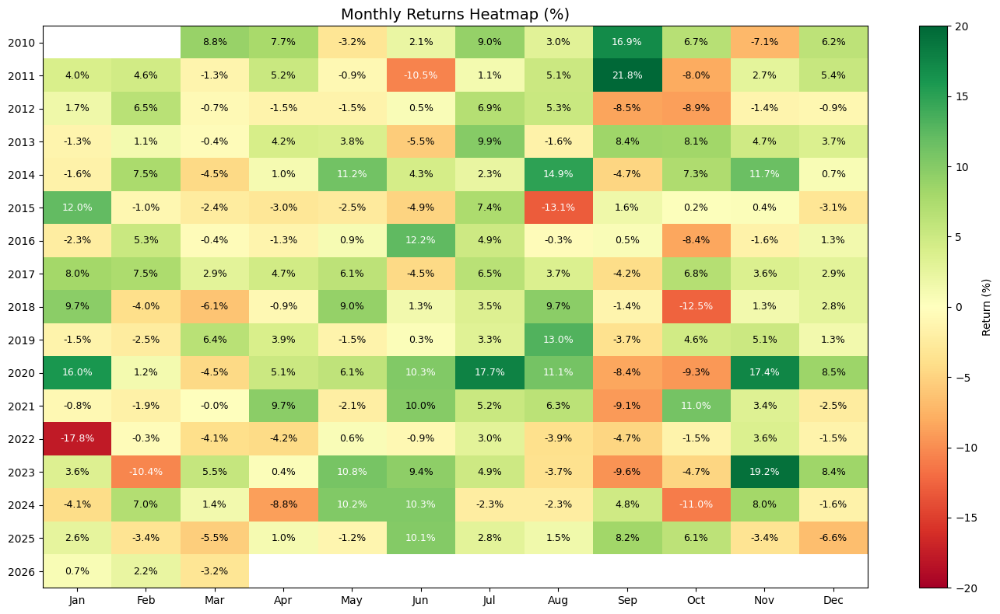

In [16]:
strategy_results['month'] = strategy_results.index.to_period('M')
monthly_rets = strategy_results.groupby('month')['portfolio_value'].last().pct_change() * 100

monthly_df = pd.DataFrame({
    'Year': monthly_rets.index.year, 'Month': monthly_rets.index.month,
    'Return': monthly_rets.values}).dropna()
heatmap_data = monthly_df.pivot(index='Year', columns='Month', values='Return')
heatmap_data.columns = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

fig, ax = plt.subplots(figsize=(14, 8))
im = ax.imshow(heatmap_data.values, cmap='RdYlGn', aspect='auto', vmin=-20, vmax=20)
ax.set_xticks(range(12)); ax.set_xticklabels(heatmap_data.columns)
ax.set_yticks(range(len(heatmap_data.index))); ax.set_yticklabels(heatmap_data.index)
for i in range(len(heatmap_data.index)):
    for j in range(12):
        val = heatmap_data.iloc[i, j]
        if not np.isnan(val):
            ax.text(j, i, f'{val:.1f}%', ha='center', va='center',
                    color='white' if abs(val) > 10 else 'black', fontsize=9)
ax.set_title('Monthly Returns Heatmap (%)', fontsize=14)
plt.colorbar(im, ax=ax, label='Return (%)')
plt.tight_layout()
plt.show()